In [3]:
# Evaluating SdA in lesion group of 636, lesion case centroid '[214,', '242,', '81]'] 

In [ ]:
# %load run_dicompatches2roi.py
"""
Created on Wed Jun 29 15:50:00 2016

@author: DeepLearning
"""
import os, os.path
import fnmatch
import SimpleITK as sitk

import six.moves.cPickle as pickle
import seaborn as sns
import pandas as pd
import numpy as np
import itertools

from patchifytest import *


def filen_patt_match(mha_lesion_loc, patternstr):
    
    selfilenm = []
    for filenm in os.listdir(mha_lesion_loc):
        if fnmatch.fnmatch(filenm, patternstr):
            selfilenm.append(filenm)
        
    return selfilenm
    
def run_mha_lesion(mha_lesion_loc, PatientID, AccessionN):
    
    ## Format query StudyID
    print "Reading volumnes..."
    if (len(PatientID) == 4 ): fPatientID=PatientID
    if (len(PatientID) == 3 ): fPatientID='0'+PatientID
    if (len(PatientID) == 2 ): fPatientID='00'+PatientID
    if (len(PatientID) == 1 ): fPatientID='000'+PatientID
     
    ## read Image (right now needs to use filename pattern matching)
    fpttrn = '*'+fPatientID+'_'+AccessionN+'_*'
    files_pttrn = filen_patt_match(mha_lesion_loc, fpttrn)
    files_Vols=[]
    for k in range(len(files_pttrn)):
        if('@' in files_pttrn[k]):
            files_Vols.append(files_pttrn[k])
    
    # find the lowest numbered series as the pre-contrast
    DynSeriesids = []
    for item in files_Vols:
        DynSeriesids.append( int(item[item.find('_')+1:item.find('@')][-3::]) )  
            
    Dynid = min(DynSeriesids)
    
    vol0f = '*'+fPatientID+'_'+AccessionN+'_'+str(int(Dynid))+'*'
    filen_Vol0 = filen_patt_match(mha_lesion_loc, vol0f)
    Vol0 = sitk.ReadImage(mha_lesion_loc+os.sep+filen_Vol0[0])
    
    vol1f = '*'+fPatientID+'_'+AccessionN+'_'+str(int(Dynid)+1)+'*'
    filen_Vol1 = filen_patt_match(mha_lesion_loc, vol1f)
    Vol1 = sitk.ReadImage(mha_lesion_loc+os.sep+filen_Vol1[0])
    
    vol2f = '*'+fPatientID+'_'+AccessionN+'_'+str(int(Dynid)+2)+'*'
    filen_Vol2 = filen_patt_match(mha_lesion_loc, vol2f)
    Vol2 = sitk.ReadImage(mha_lesion_loc+os.sep+filen_Vol2[0])
    
    vol3f = '*'+fPatientID+'_'+AccessionN+'_'+str(int(Dynid)+3)+'*'
    filen_Vol3 = filen_patt_match(mha_lesion_loc, vol3f)
    Vol3 = sitk.ReadImage(mha_lesion_loc+os.sep+filen_Vol3[0])
    
    vol4f = '*'+fPatientID+'_'+AccessionN+'_'+str(int(Dynid)+4)+'*'
    filen_Vol4 = filen_patt_match(mha_lesion_loc, vol4f)
    Vol4 = sitk.ReadImage(mha_lesion_loc+os.sep+filen_Vol4[0])

    # reformat Vol slices as Float32
    Vol0 = sitk.GetArrayFromImage(sitk.Cast(Vol0,sitk.sitkFloat32))
    Vol1 = sitk.GetArrayFromImage(sitk.Cast(Vol1,sitk.sitkFloat32))
    Vol2 = sitk.GetArrayFromImage(sitk.Cast(Vol2,sitk.sitkFloat32))
    Vol3 = sitk.GetArrayFromImage(sitk.Cast(Vol3,sitk.sitkFloat32))
    Vol4 = sitk.GetArrayFromImage(sitk.Cast(Vol4,sitk.sitkFloat32))

    
    # list post contrast volumes usually Vol1.GetSize() = (512, 512, 88)
    slicestime = [ Vol0,
                   Vol1, 
                   Vol2,
                   Vol3, 
                   Vol4]  
                   
    return slicestime
    

   
if __name__ == '__main__':
    
    # start by reading mha imgaes
    mha_lesion_loc='Y:/Breast/mha_lesion_labels_ground_truth/'
    patched_mris = 'view_allpatched_mris_miningBreastMRIdata.csv'
    topatch_mris = 'view_allLesions_textureUpdatedFeat.txt'

    # Open filename patched_mris
    patched_ids = pd.read_csv(patched_mris)
    
    # Open filename topatched_mris
    topatch_ids = open(topatch_mris,"r")
    topatch_ids.seek(0)
    line = topatch_ids.readline()
    line = topatch_ids.readline()
       
    # run first case of mris
    # Get the line: Study#, DicomExam#
    fileline = line.split()
    lesion_id = fileline[0]
    PatientID = fileline[1] # in case of not MRN
    print(fileline)

    # continue with patient not already patched
    AccessionN = fileline[2]
    dateID = fileline[3] #dateID = '2010-11-29' as '2010,11,29';
    side = fileline[4]
    typeEnh = fileline[5]
    centroidLoc = fileline[6:]
    print '%%%%%%%%%%%%%%%%%%%%%% Centroid Loc and slice = %s '% fileline[6:]
    
    #############################
    ###### Retrieving mhas
    #############################
    slicestime = run_mha_lesion(mha_lesion_loc, PatientID, AccessionN)
    
    #############################                
    ## 3) Sample patch from Image
    #############################
    ha=10; wa=10; stride=10
    extrP = Patchifytest()
    
    alltestpatches = extrP.extractestPatches(slicestime, ha, wa, stride, 'test')
    print(len(alltestpatches))
                

        
        
    ###########
    ## Process Resuts
    ###########
 


['2', '16', '6920252', '2011-09-24', 'Right', 'massB', 'FLORID', 'DUCT', 'HYPERPLASIA', '[214,', '242,', '81]']
%%%%%%%%%%% Centroid Loc and slice = ['FLORID', 'DUCT', 'HYPERPLASIA', '[214,', '242,', '81]'] 
Reading volumnes...
(92.994446, 11272.389)
(138.36362, 28783.857)
(139.95534, 28440.148)
(141.1861, 28419.902)
(141.89912, 28429.563)
 
 Classifying slice no 0...


DEBUG: nvcc STDOUT mod.cu
   Creating library E:/Users/DeepLearning/AppData/Local/Theano/compiledir_Windows-7-6.1.7601-SP1-Intel64_Family_6_Model_60_Stepping_3_GenuineIntel-2.7.11-64/tmpxgces3/265abc51f7c376c224983485238ff1a5.lib and object E:/Users/DeepLearning/AppData/Local/Theano/compiledir_Windows-7-6.1.7601-SP1-Intel64_Family_6_Model_60_Stepping_3_GenuineIntel-2.7.11-64/tmpxgces3/265abc51f7c376c224983485238ff1a5.exp

Using gpu device 0: GeForce GTX 780 (CNMeM is enabled with initial size: 90.0% of memory, CuDNN 3007)


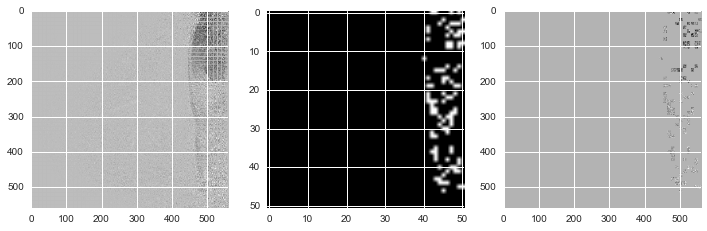

done plotting positives = 99
 
 Classifying slice no 1...


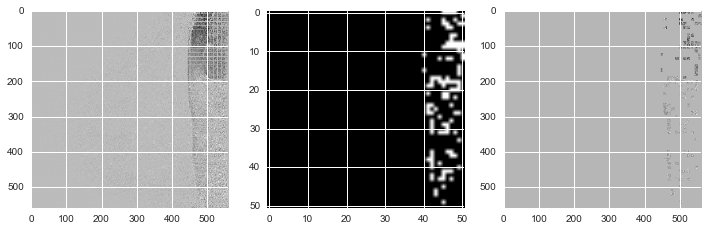

done plotting positives = 112
 
 Classifying slice no 2...


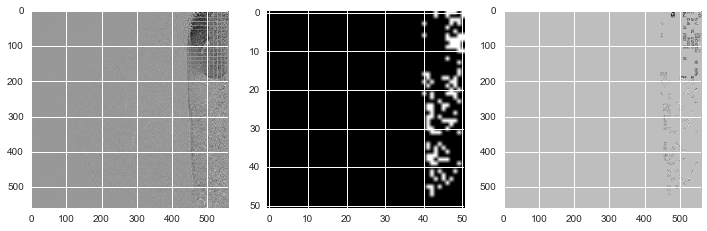

done plotting positives = 120
 
 Classifying slice no 3...


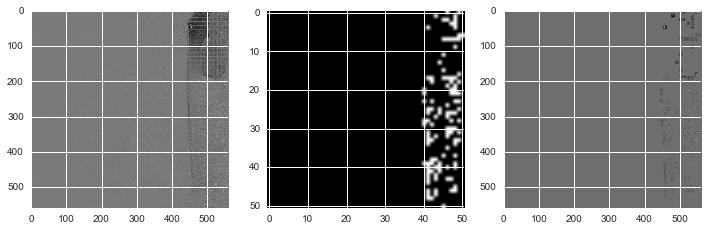

done plotting positives = 114
 
 Classifying slice no 4...


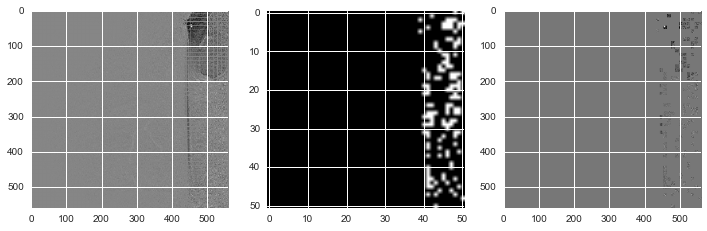

done plotting positives = 132
 
 Classifying slice no 5...


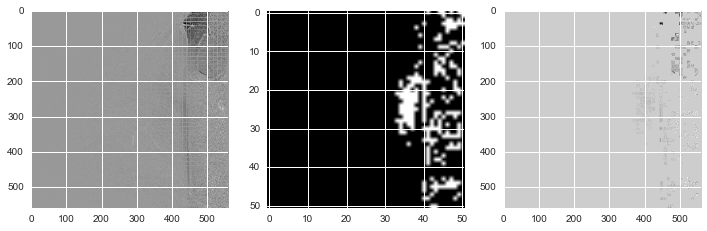

done plotting positives = 218
 
 Classifying slice no 6...


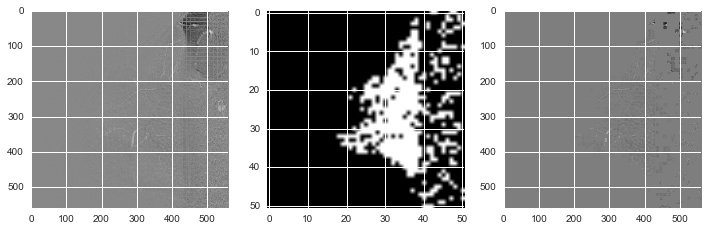

done plotting positives = 497
 
 Classifying slice no 7...


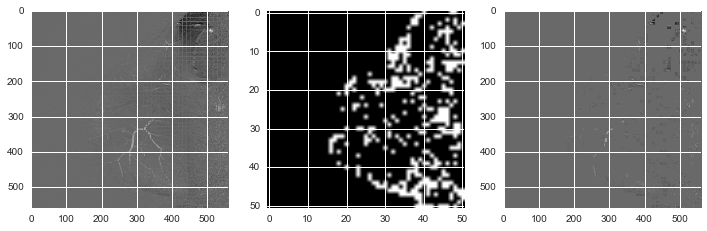

done plotting positives = 343
 
 Classifying slice no 8...


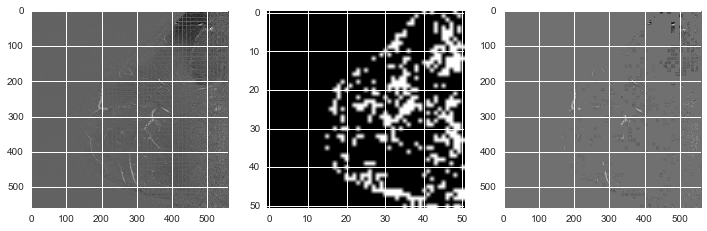

done plotting positives = 396
 
 Classifying slice no 9...


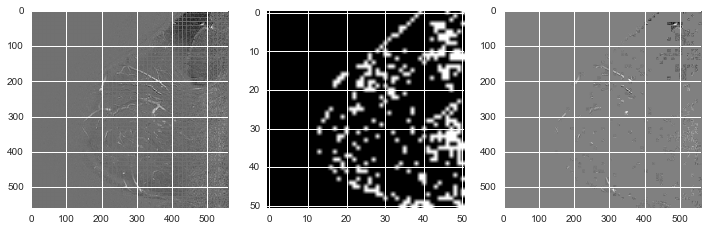

done plotting positives = 331
 
 Classifying slice no 10...


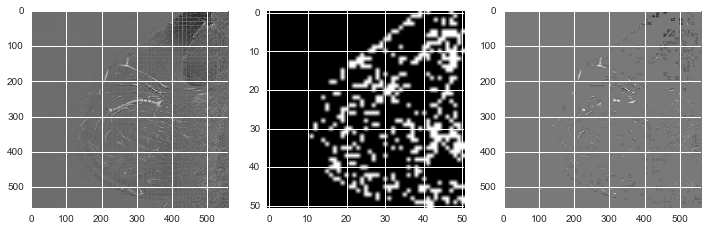

done plotting positives = 411
 
 Classifying slice no 11...


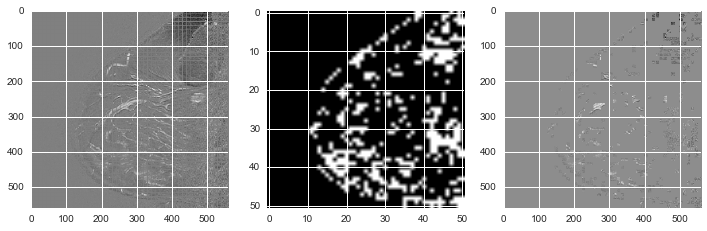

done plotting positives = 422
 
 Classifying slice no 12...


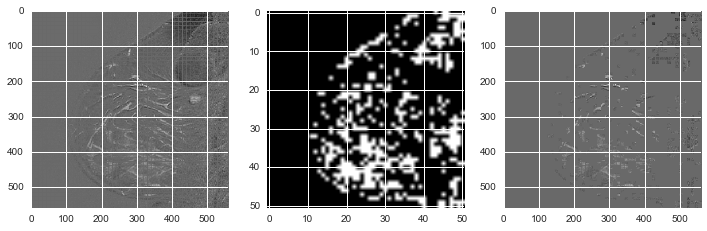

done plotting positives = 467
 
 Classifying slice no 13...


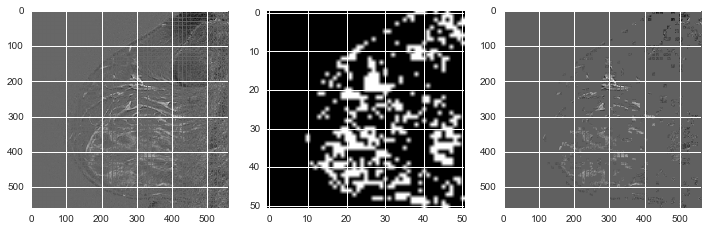

done plotting positives = 479
 
 Classifying slice no 14...


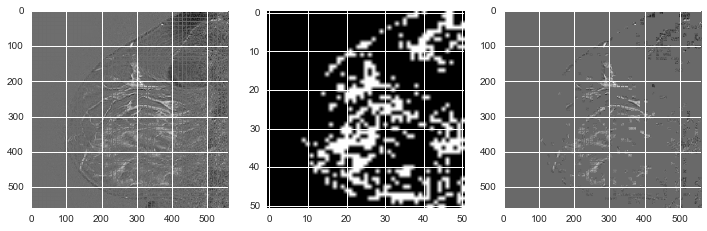

done plotting positives = 502
 
 Classifying slice no 15...


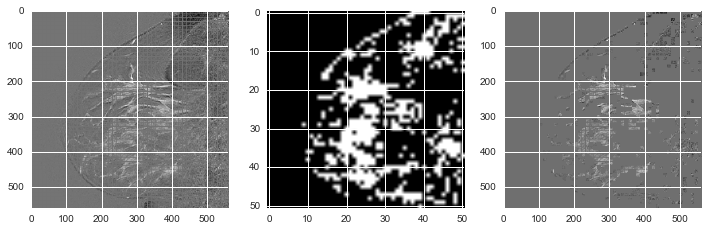

done plotting positives = 558
 
 Classifying slice no 16...


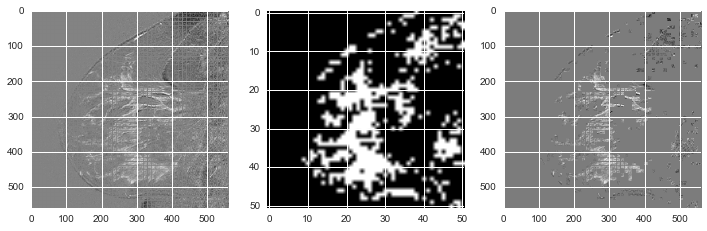

done plotting positives = 548
 
 Classifying slice no 17...


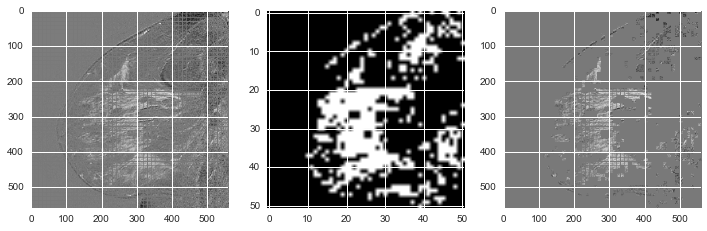

done plotting positives = 601
 
 Classifying slice no 18...


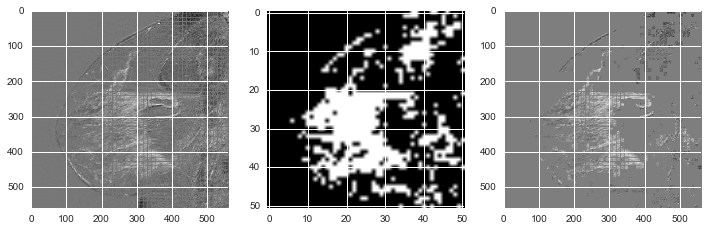

done plotting positives = 672
 
 Classifying slice no 19...


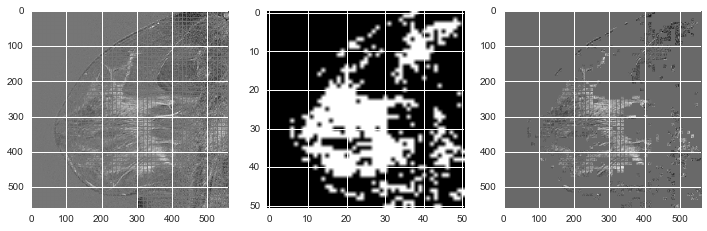

done plotting positives = 701
 
 Classifying slice no 20...


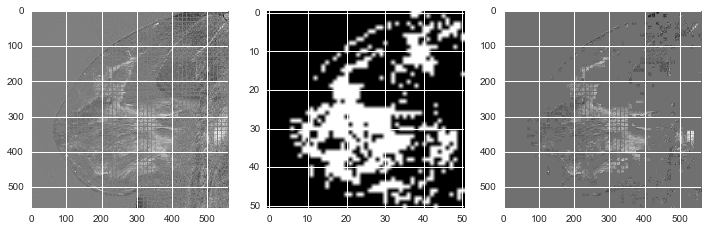

done plotting positives = 693
 
 Classifying slice no 21...


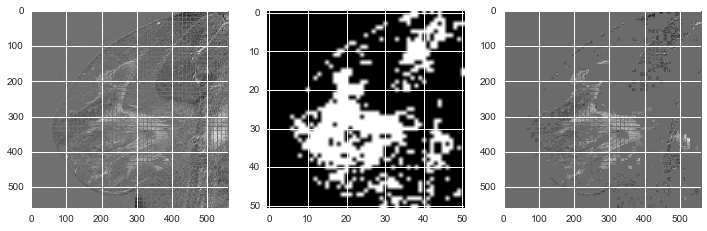

done plotting positives = 666
 
 Classifying slice no 22...


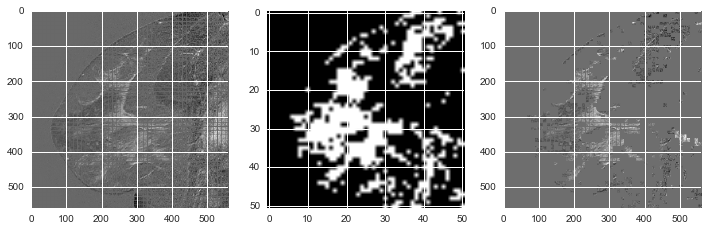

done plotting positives = 617
 
 Classifying slice no 23...


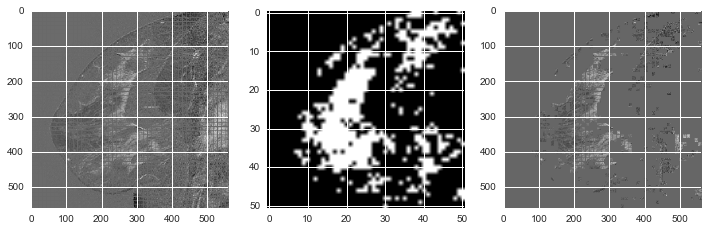

done plotting positives = 580
 
 Classifying slice no 24...


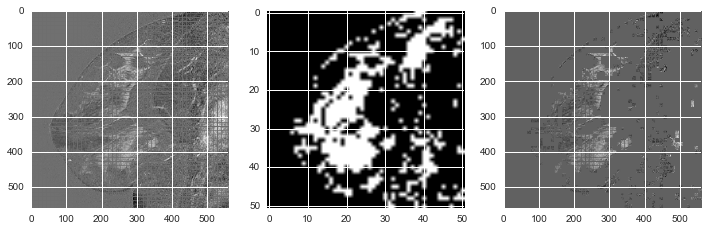

done plotting positives = 607
 
 Classifying slice no 25...


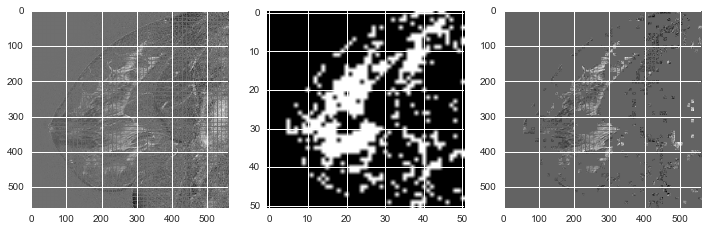

done plotting positives = 570
 
 Classifying slice no 26...


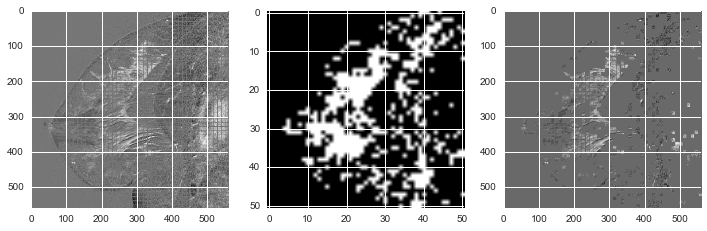

done plotting positives = 574
 
 Classifying slice no 27...


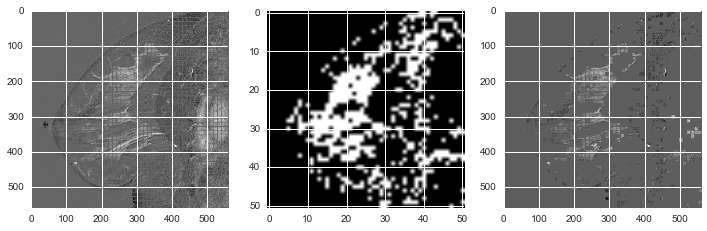

done plotting positives = 564
 
 Classifying slice no 28...


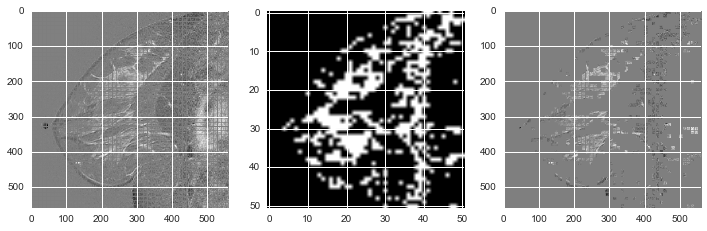

done plotting positives = 557
 
 Classifying slice no 29...


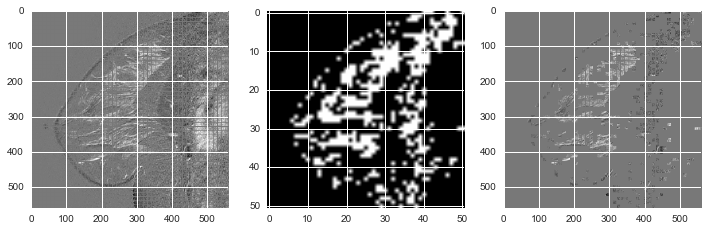

done plotting positives = 499
 
 Classifying slice no 30...


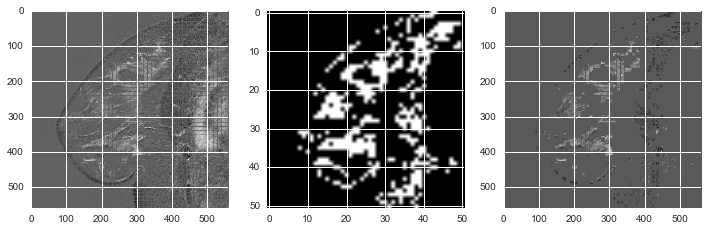

done plotting positives = 438
 
 Classifying slice no 31...


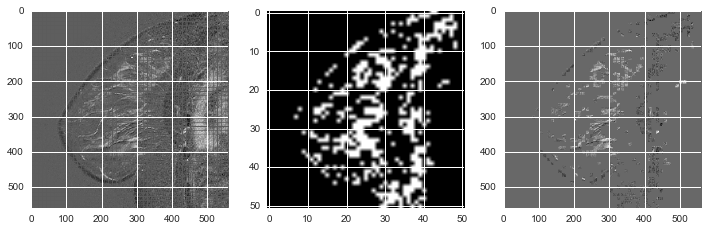

done plotting positives = 437
 
 Classifying slice no 32...


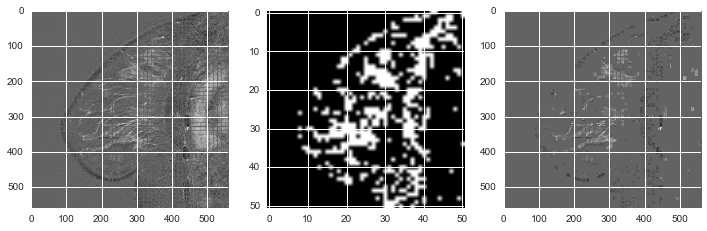

done plotting positives = 478
 
 Classifying slice no 33...


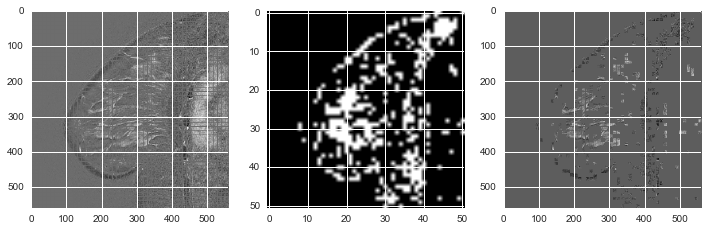

done plotting positives = 430
 
 Classifying slice no 34...


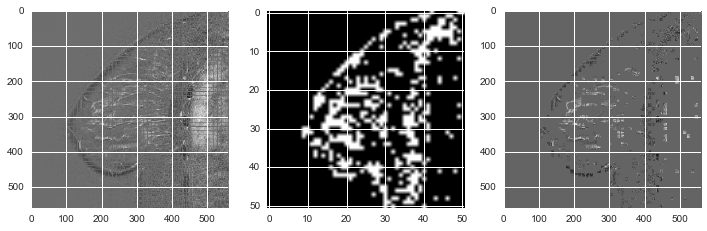

done plotting positives = 445
 
 Classifying slice no 35...


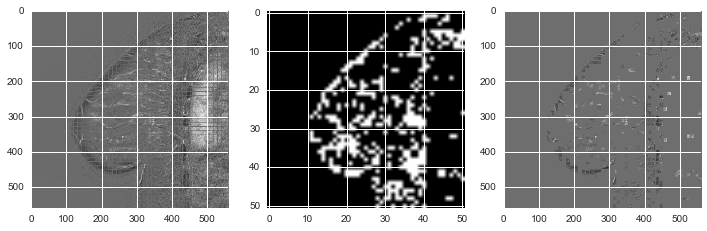

done plotting positives = 392
 
 Classifying slice no 36...


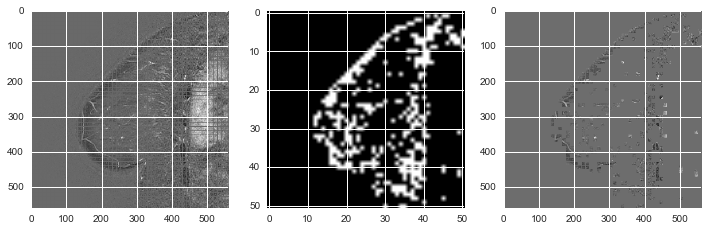

done plotting positives = 356
 
 Classifying slice no 37...


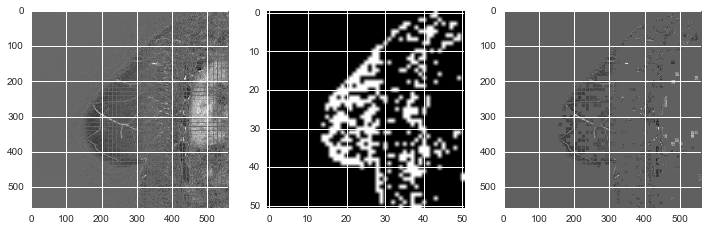

done plotting positives = 432
 
 Classifying slice no 38...


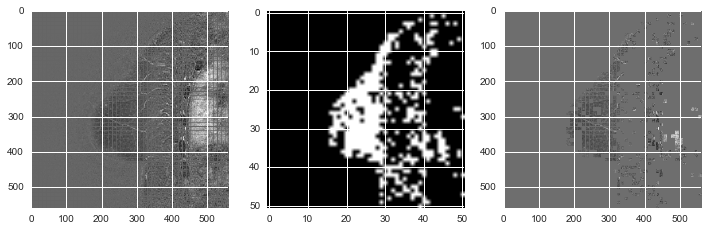

done plotting positives = 434
 
 Classifying slice no 39...


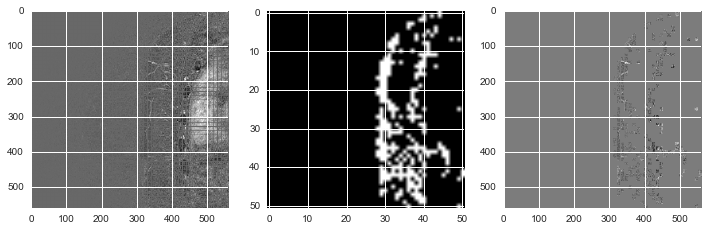

done plotting positives = 259
 
 Classifying slice no 40...


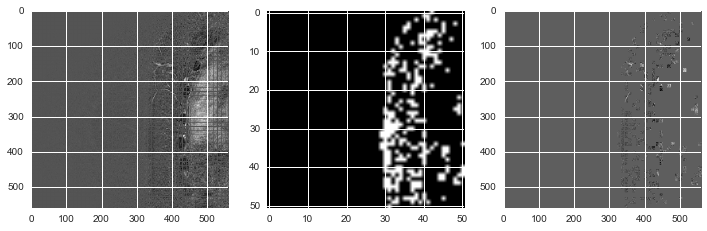

done plotting positives = 253
 
 Classifying slice no 41...


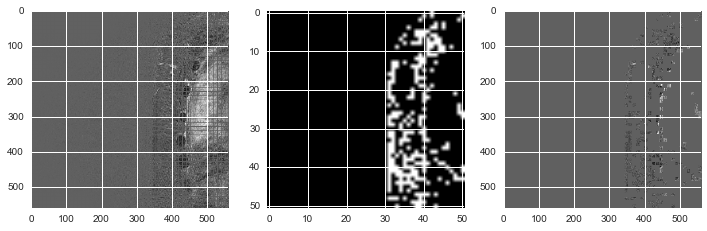

done plotting positives = 249
 
 Classifying slice no 42...


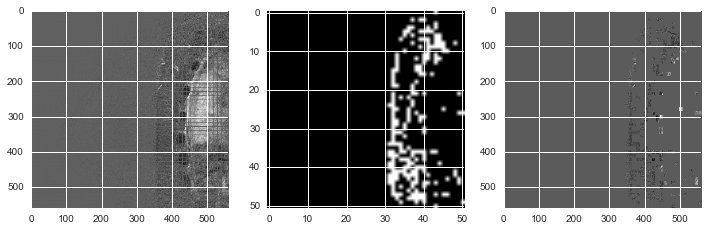

done plotting positives = 214
 
 Classifying slice no 43...


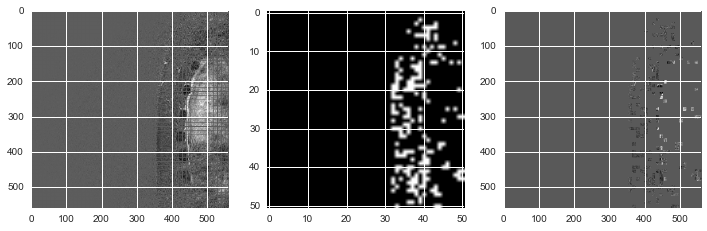

done plotting positives = 183
 
 Classifying slice no 44...


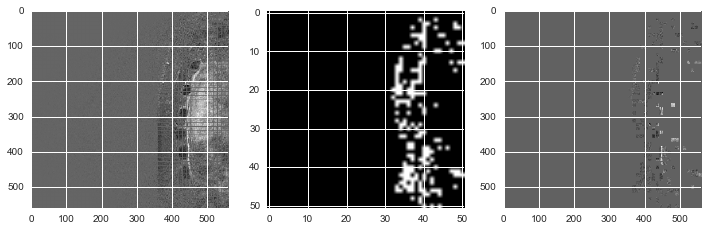

done plotting positives = 180
 
 Classifying slice no 45...


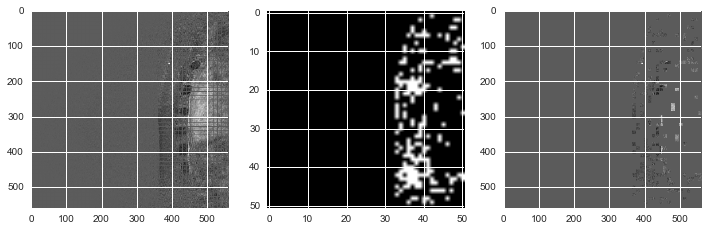

done plotting positives = 192
 
 Classifying slice no 46...


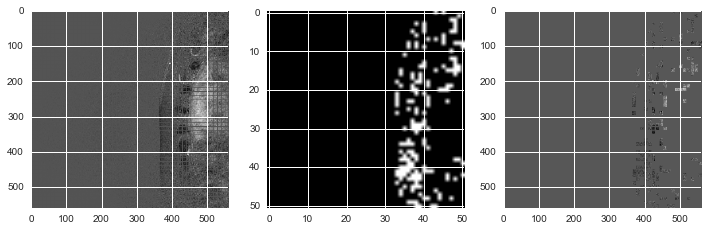

done plotting positives = 169
 
 Classifying slice no 47...


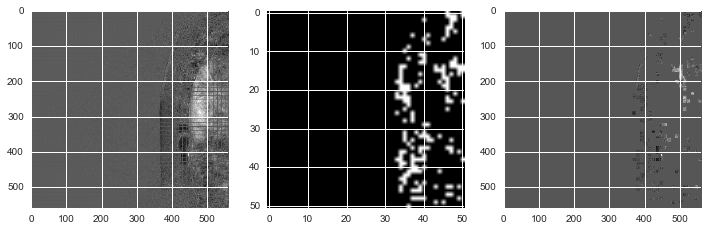

done plotting positives = 165
 
 Classifying slice no 48...


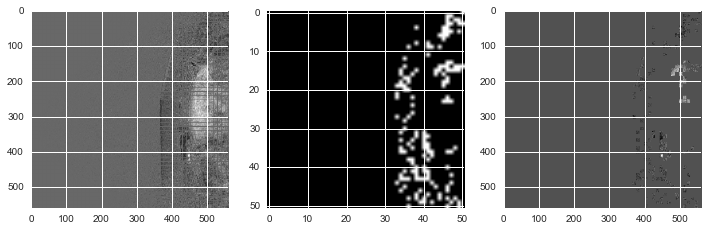

done plotting positives = 150
 
 Classifying slice no 49...


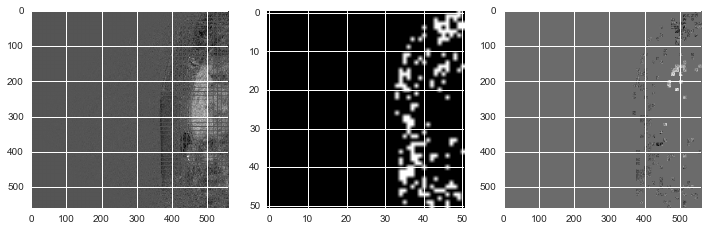

done plotting positives = 174
 
 Classifying slice no 50...


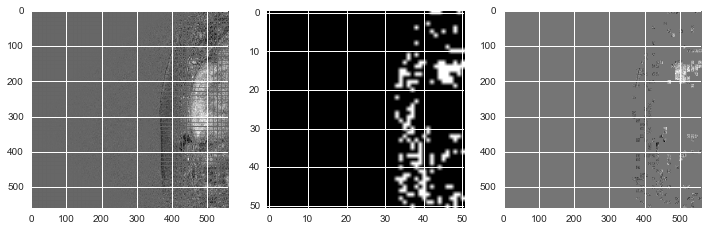

done plotting positives = 175
 
 Classifying slice no 51...


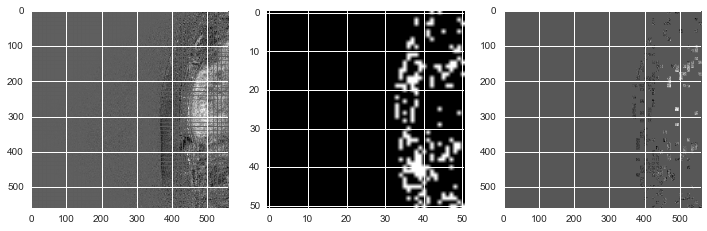

done plotting positives = 189
 
 Classifying slice no 52...


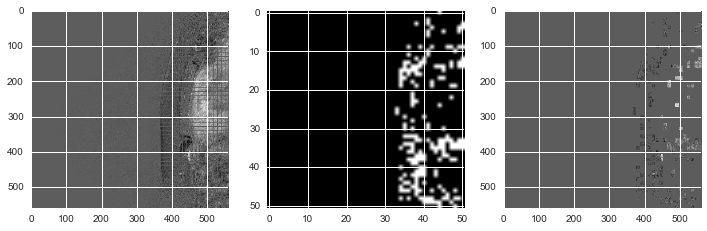

done plotting positives = 188
 
 Classifying slice no 53...


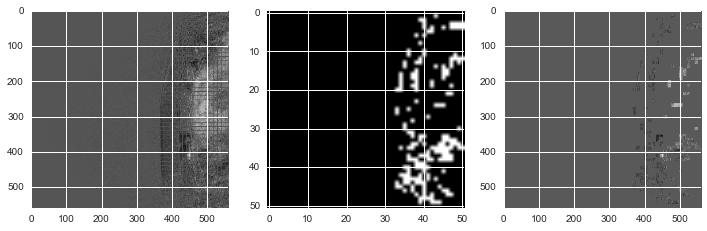

done plotting positives = 181
 
 Classifying slice no 54...


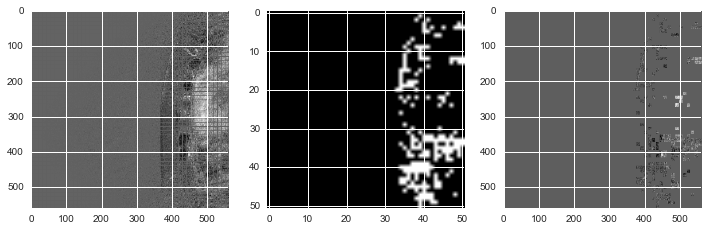

done plotting positives = 199
 
 Classifying slice no 55...


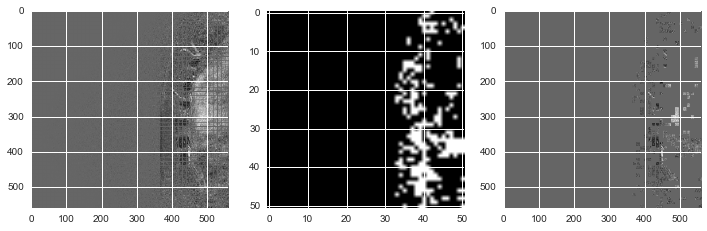

done plotting positives = 242
 
 Classifying slice no 56...


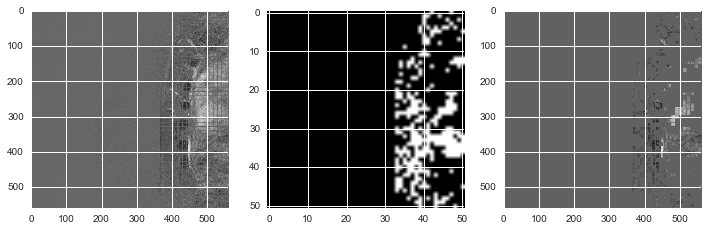

done plotting positives = 281
 
 Classifying slice no 57...


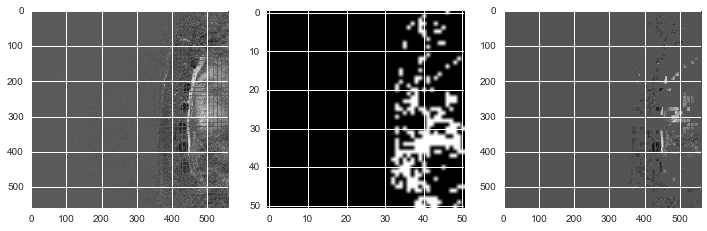

done plotting positives = 253
 
 Classifying slice no 58...


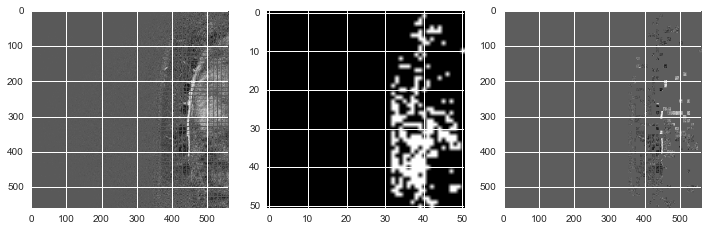

done plotting positives = 258
 
 Classifying slice no 59...


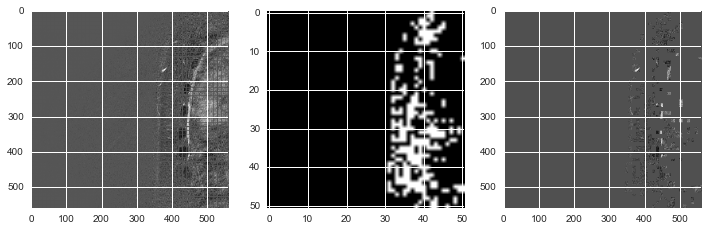

done plotting positives = 274
 
 Classifying slice no 60...


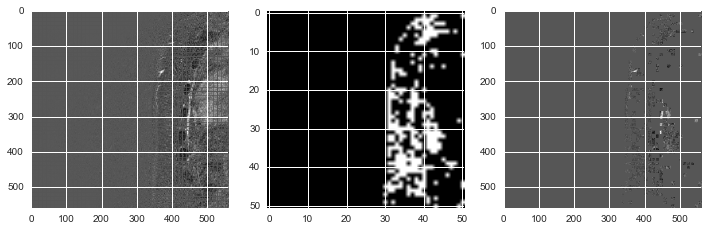

done plotting positives = 274
 
 Classifying slice no 61...


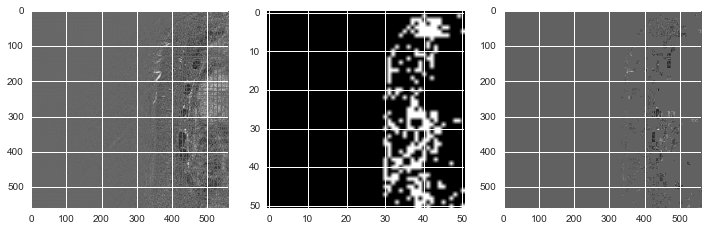

done plotting positives = 265
 
 Classifying slice no 62...


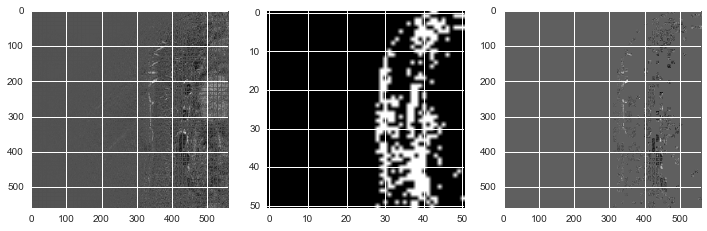

done plotting positives = 337
 
 Classifying slice no 63...


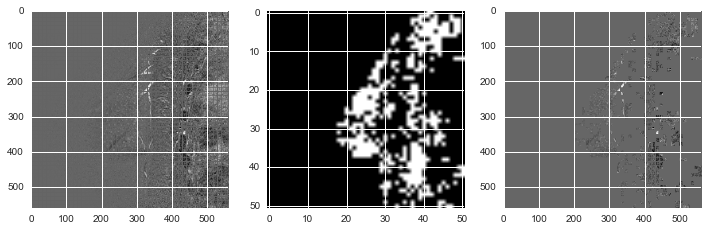

done plotting positives = 429
 
 Classifying slice no 64...


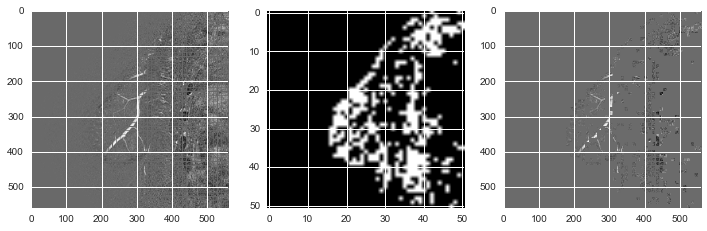

done plotting positives = 425
 
 Classifying slice no 65...


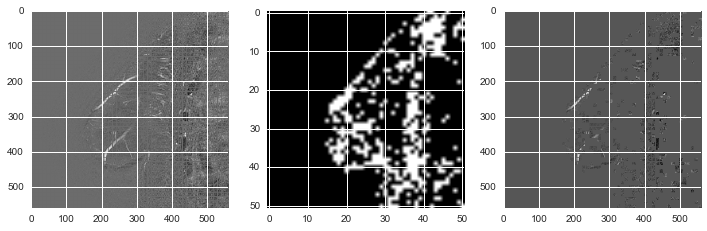

done plotting positives = 419
 
 Classifying slice no 66...


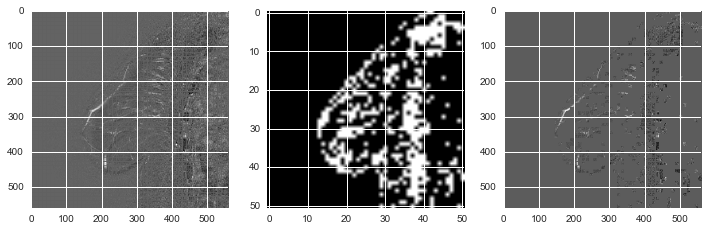

done plotting positives = 458
 
 Classifying slice no 67...


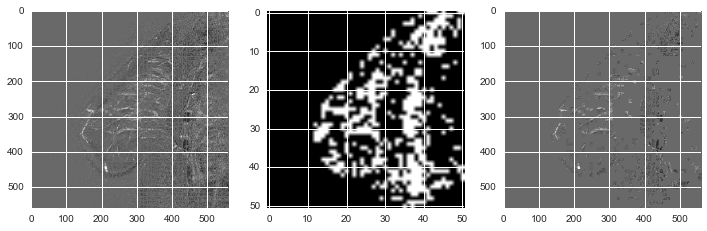

done plotting positives = 510
 
 Classifying slice no 68...


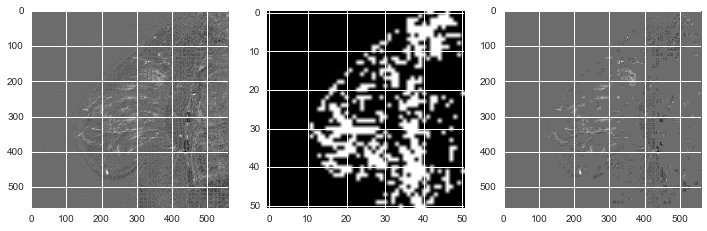

done plotting positives = 539
 
 Classifying slice no 69...


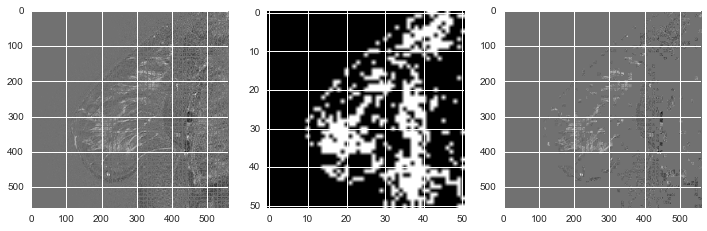

done plotting positives = 576
 
 Classifying slice no 70...


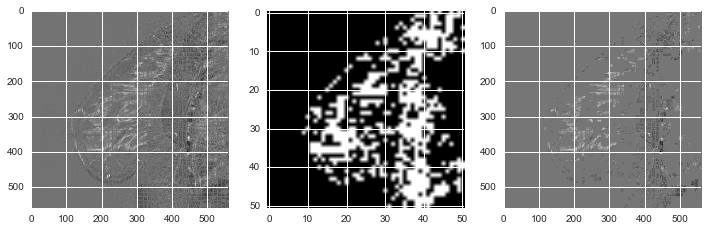

done plotting positives = 608
 
 Classifying slice no 71...


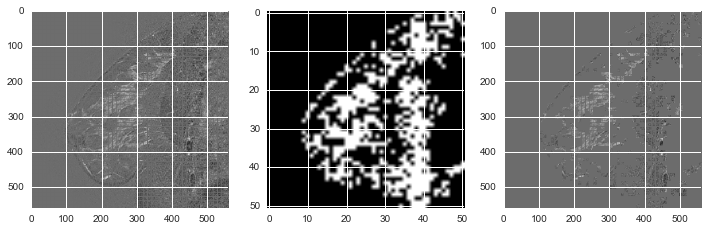

done plotting positives = 620
 
 Classifying slice no 72...


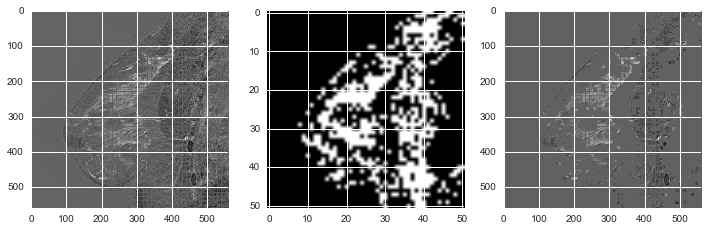

done plotting positives = 605
 
 Classifying slice no 73...


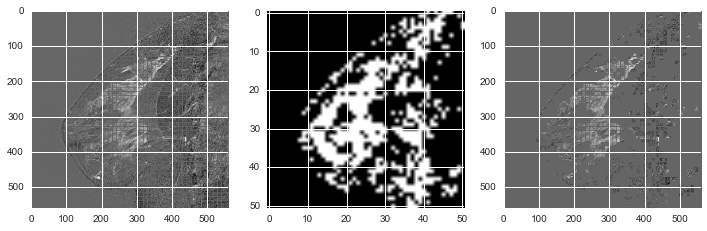

done plotting positives = 637
 
 Classifying slice no 74...


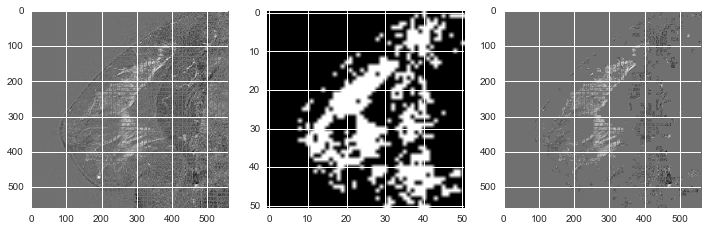

done plotting positives = 633
 
 Classifying slice no 75...


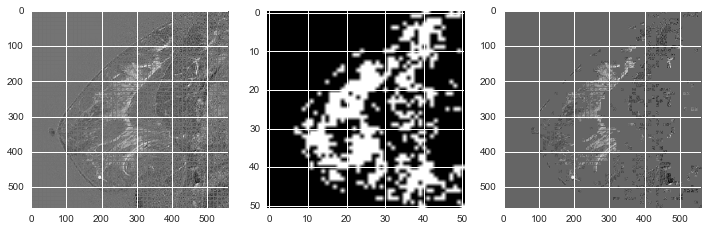

done plotting positives = 638
 
 Classifying slice no 76...


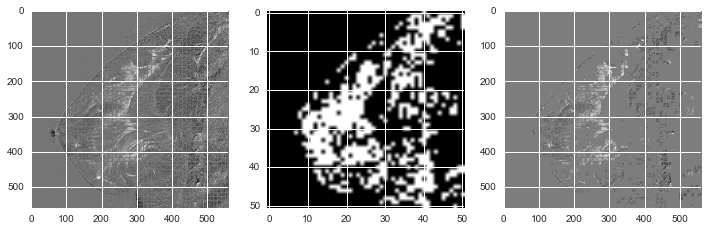

done plotting positives = 657
 
 Classifying slice no 77...


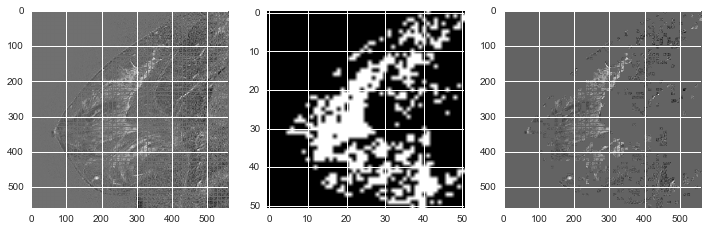

done plotting positives = 624
 
 Classifying slice no 78...


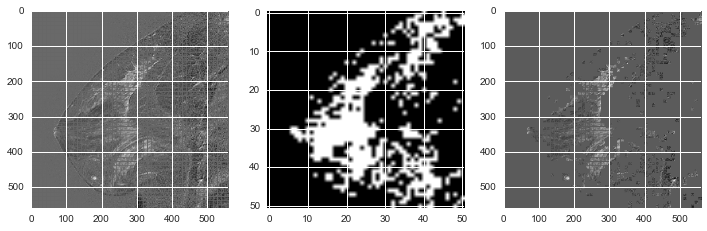

done plotting positives = 621
 
 Classifying slice no 79...


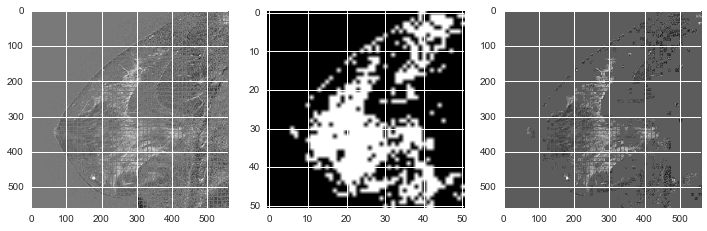

done plotting positives = 718
 
 Classifying slice no 80...


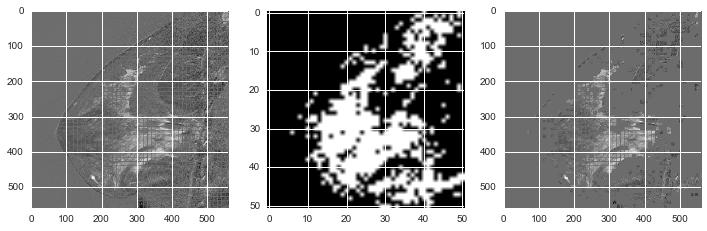

done plotting positives = 741
 
 Classifying slice no 81...


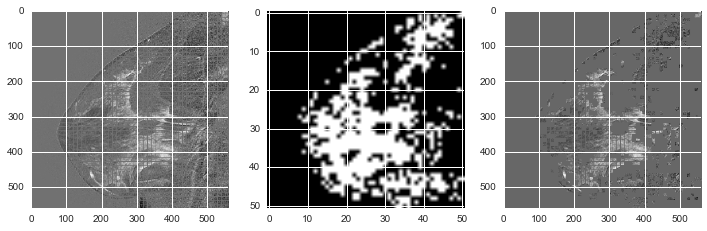

done plotting positives = 726
 
 Classifying slice no 82...


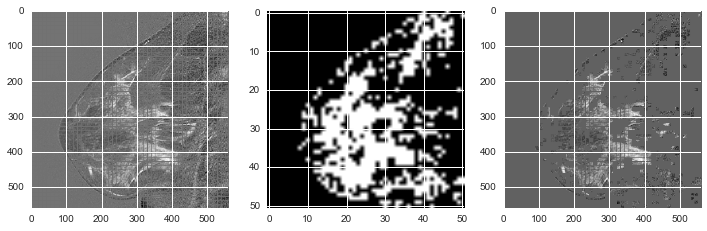

done plotting positives = 699
 
 Classifying slice no 83...


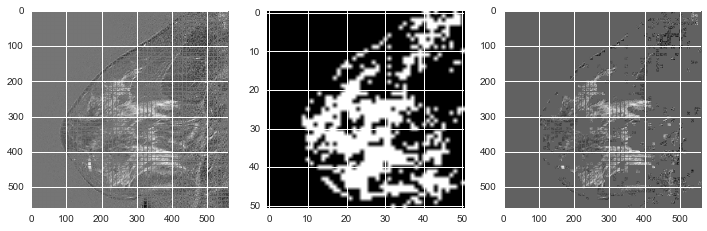

done plotting positives = 699
 
 Classifying slice no 84...


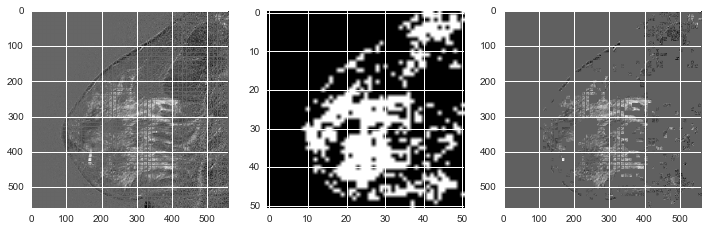

done plotting positives = 659
 
 Classifying slice no 85...


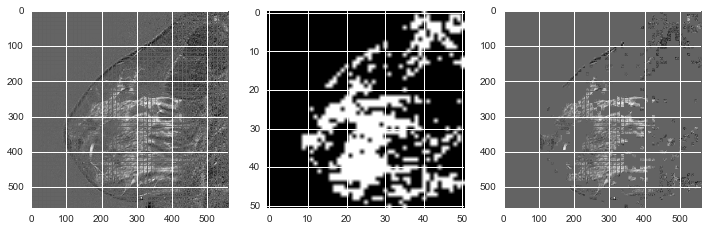

done plotting positives = 617
 
 Classifying slice no 86...


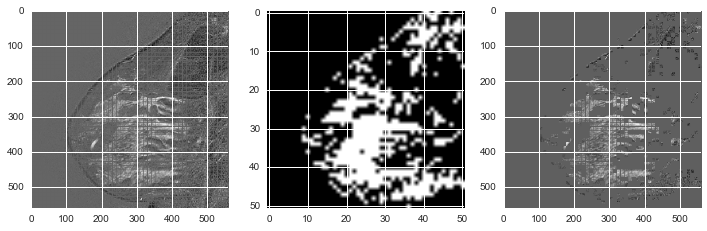

done plotting positives = 627
 
 Classifying slice no 87...


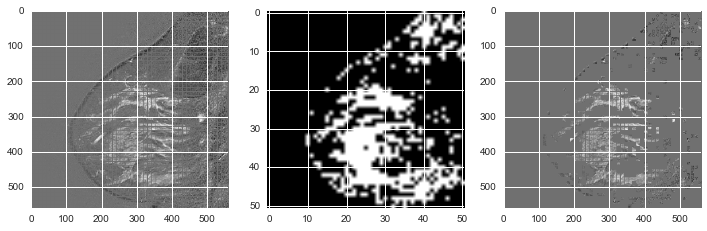

done plotting positives = 577
 
 Classifying slice no 88...


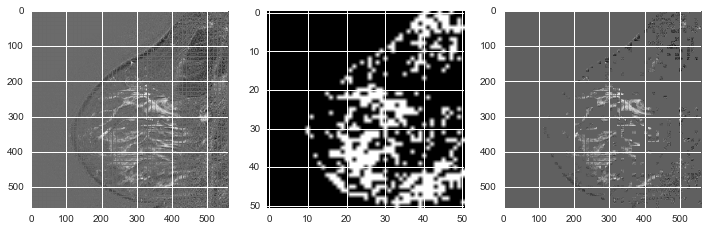

done plotting positives = 537
 
 Classifying slice no 89...


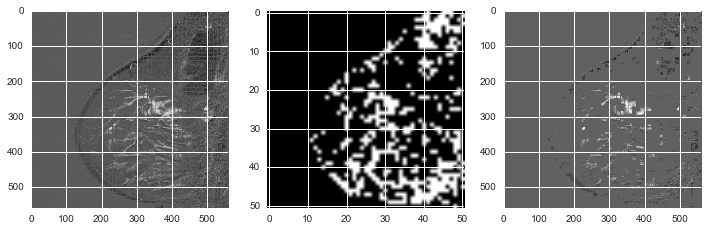

done plotting positives = 457
 
 Classifying slice no 90...


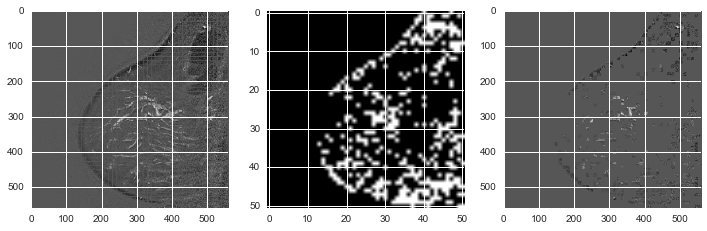

done plotting positives = 400
 
 Classifying slice no 91...


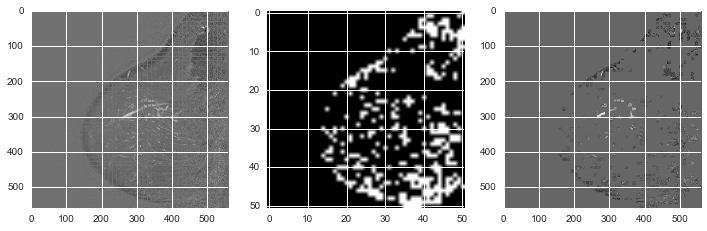

done plotting positives = 366
 
 Classifying slice no 92...


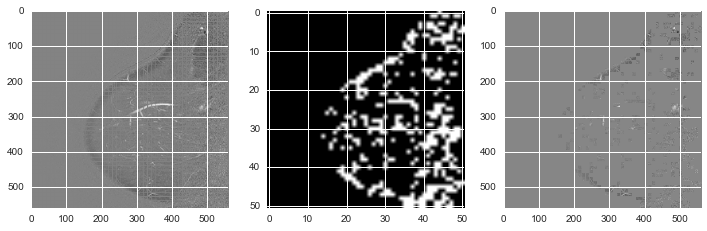

done plotting positives = 378
 
 Classifying slice no 93...


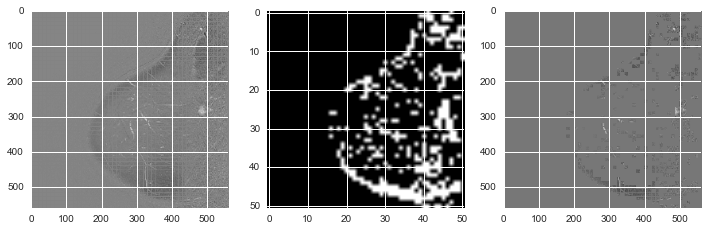

done plotting positives = 363
 
 Classifying slice no 94...


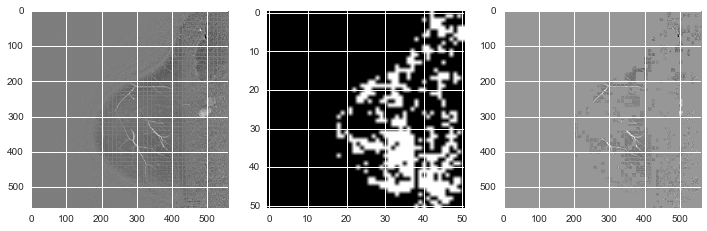

done plotting positives = 464
 
 Classifying slice no 95...


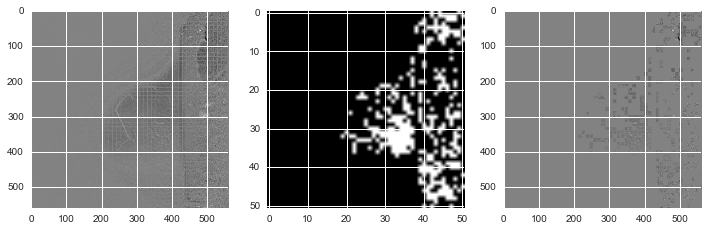

done plotting positives = 334
 
 Classifying slice no 96...


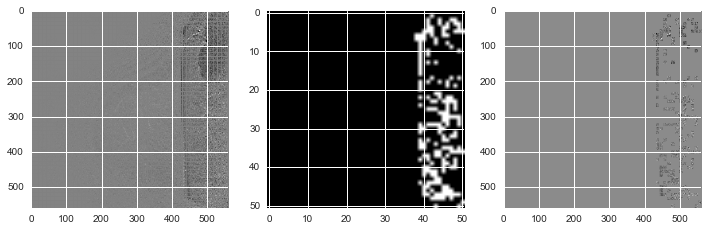

done plotting positives = 187
 
 Classifying slice no 97...


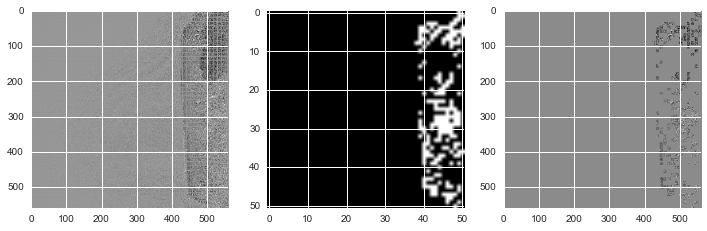

done plotting positives = 197
 
 Classifying slice no 98...


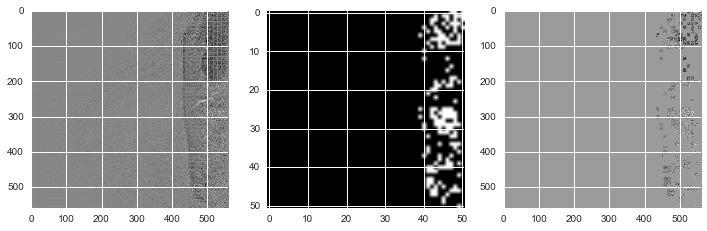

done plotting positives = 157
 
 Classifying slice no 99...


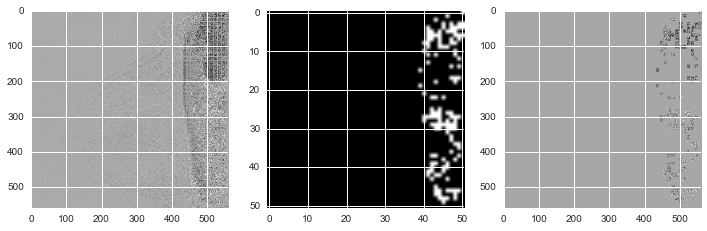

done plotting positives = 132
100


In [2]:
import matplotlib.pyplot as plt
%matplotlib inline
%run run_dicompatches2roi.py